In [4]:
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification - Copy.zip" -d "drive/MyDrive/Dog Vision/"

In [5]:
#from google.colab import drive
#drive.mount('/content/drive')

### 🐶 End-to-end Multil-class Dog Breed Classification
This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

### 1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

### 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

### 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

### 4. Features
Some information about the data:

We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
There are 120 breeds of dogs (this means there are 120 different classes).
There are around 10,000+ images in the training set (these images have labels).
There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

### Getting our workspace ready

In [6]:
import tensorflow as tf
print("the version is ",tf.__version__)

the version is  2.17.1


In [7]:
import tensorflow_hub as hub
print("hub version is ", hub.__version__)

hub version is  0.16.1


In [8]:
print("presence of gpu "  if tf.config.list_physical_devices("GPU") else ("oo no"))

presence of gpu 


## Getting the data ready

Turning the images into tensors

In [9]:
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")

In [10]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [11]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

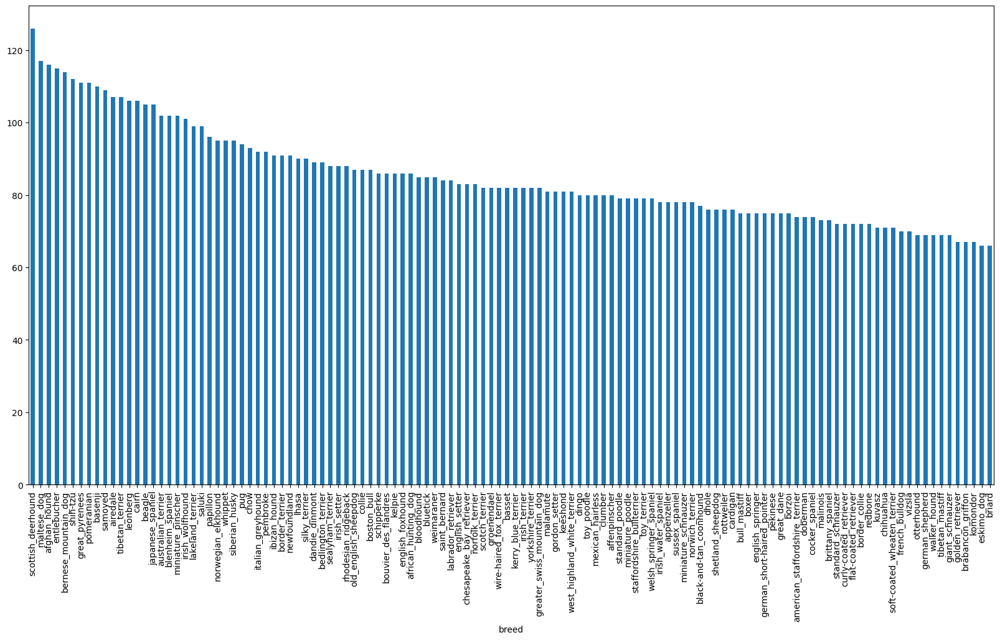

In [12]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [13]:
labels_csv["breed"].value_counts().median()

82.0

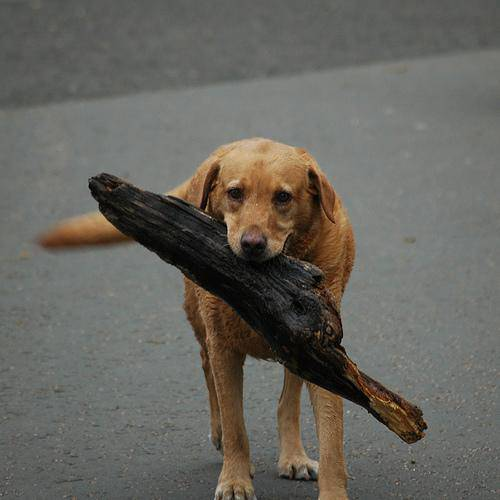

In [14]:
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

Getting images and their labels

In [15]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [16]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


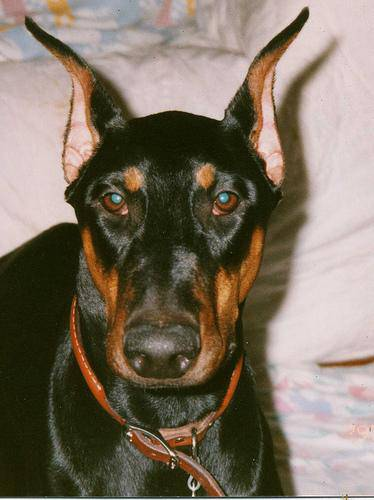

In [17]:
Image(filenames[9001])

In [18]:
labels_csv["breed"][9001]

'doberman'

In [19]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [20]:
# Checkn if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [21]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [22]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [23]:
len(labels)

10222

In [24]:
len(boolean_labels)

10222

In [25]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [26]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [27]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [28]:
# Setup X & y variables
X = filenames
y = boolean_labels

It's just good practice to first train a model with few data and then increase the training data gradually

In [29]:
# Set number of images to use for experimenting

NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [30]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [31]:
# Let's look at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

Pre processing the images i.e turning images into tensors

In [32]:
  # Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [33]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [34]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Take an image filepath as input

Use TensorFlow to read the file and save it to a variable, image

Turn our image (a jpg) into Tensors

Normalize our image (convert color channel values from from 0-255 to 0-1).

Resize the image to be a shape of (224, 224)

Return the modified image

More information on loading images in TensorFlow can be seen here: https://www.tensorflow.org/tutorials/load_data/images

In [35]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches


Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: (image, label).

In [36]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [37]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [38]:
 # Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [39]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [40]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

In [41]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [42]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

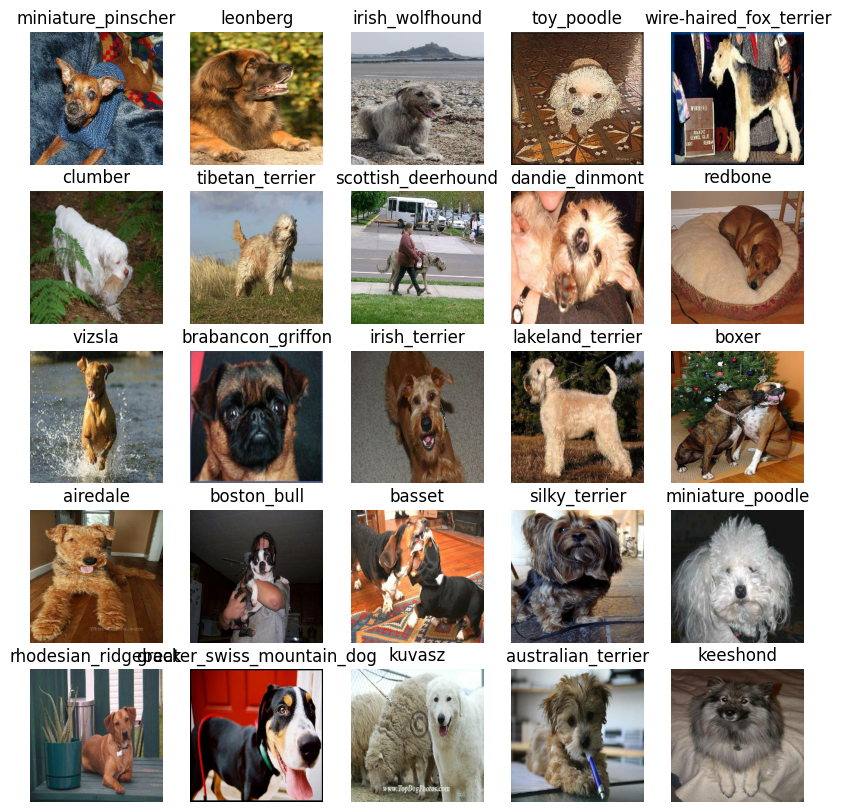

In [43]:
 # Now let's visualize the data in a training batch
 train_images, train_labels = next(train_data.as_numpy_iterator())
 show_25_images(train_images, train_labels)

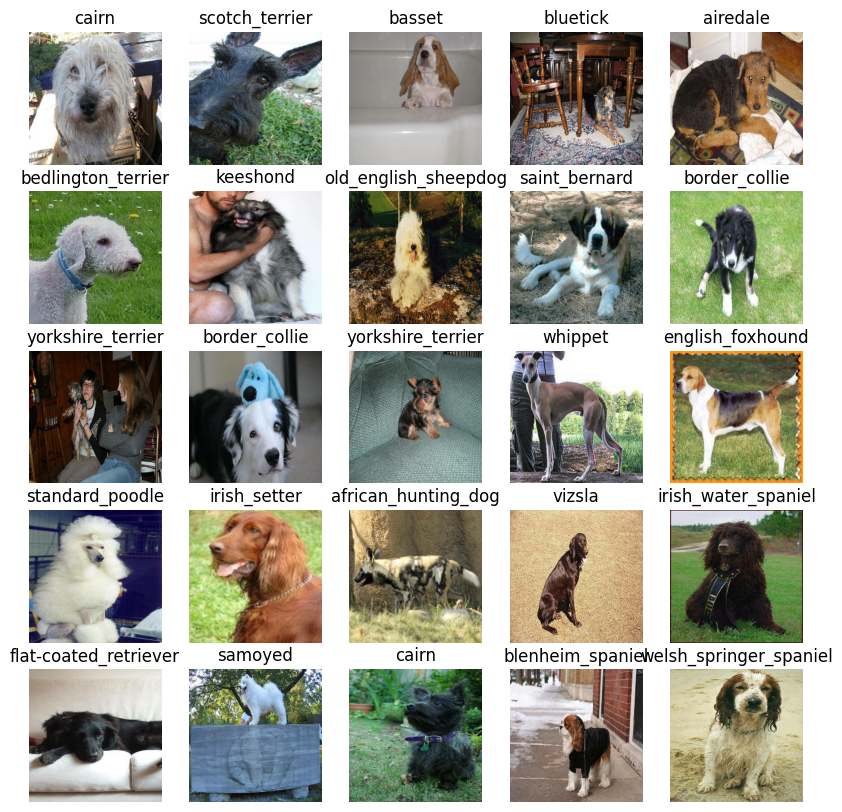

In [44]:
 # Now let's visualize our validation set
 val_images, val_labels = next(val_data.as_numpy_iterator())
 show_25_images(val_images, val_labels)

### Building the model
Before we build a model, there are a few things we need to define:

The input shape (our images shape, in the form of Tensors) to our model.
The output shape (image labels, in the form of Tensors) of our model.
The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [45]:
IMG_SIZE

224

In [46]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [47]:
INPUT_SHAPE

[None, 224, 224, 3]

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

Takes the input shape, output shape and the model we've chosen as parameters.
Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
Compiles the model (says it should be evaluated and improved).
Builds the model (tells the model the input shape it'll be getting).
Returns the model.
All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [48]:
OUTPUT_SHAPE

120

In [49]:
import tf_keras as keras
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=keras.losses.CategoricalCrossentropy(),
      optimizer=keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [50]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

###TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:

Load the TensorBoard notebook extension ✅
Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. ✅
Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [51]:
 # Load TensorBoard notebook extension
%load_ext tensorboard

In [52]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/Logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [53]:
# Create early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

### Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [54]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [55]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


Let's create a function which trains a model.

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [56]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a modelusing the previously defind function
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [57]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 118s 3s/step - loss: 4.5434 - accuracy: 0.0962 - val_loss: 3.4090 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 5s 198ms/step - loss: 1.6232 - accuracy: 0.6862 - val_loss: 2.1680 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 4s 175ms/step - loss: 0.5703 - accuracy: 0.9187 - val_loss: 1.6920 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 5s 186ms/step - loss: 0.2610 - accuracy: 0.9837 - val_loss: 1.5031 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 5s 202ms/step - loss: 0.1494 - accuracy: 0.9975 - val_loss: 1.4023 - val_accuracy: 0.6650
Epoch 6/100
25/25 [==============================] - 4s 158ms/step - loss: 0.1032 - accuracy: 0.9987 - val_loss: 1.3549 - val_accuracy: 0.6800
Epoch 7/100
25/25 [==============================]

### Checking the TensorBoard logs
The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [58]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/Logs

Output hidden; open in https://colab.research.google.com to view.

### Making and evaluating predictions using a trained model

In [59]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [60]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) #verbose give the progress of work
predictions

7/7 [==============================] - 2s 159ms/step


array([[3.02149006e-03, 2.02506882e-04, 3.56691261e-03, ...,
        1.74964502e-04, 4.27328778e-05, 2.41793180e-03],
       [6.30906143e-04, 6.13764720e-03, 1.46039324e-02, ...,
        1.81185649e-04, 8.23464710e-03, 1.67497026e-04],
       [9.66059702e-07, 8.06563767e-05, 6.08959499e-06, ...,
        5.62084824e-06, 1.49533043e-05, 1.00106605e-04],
       ...,
       [9.86024861e-06, 2.92477071e-05, 1.05074621e-04, ...,
        1.01273536e-05, 4.32606939e-05, 8.28424672e-05],
       [1.36972661e-03, 2.37283050e-04, 4.96519438e-04, ...,
        5.16613509e-05, 3.08903800e-05, 1.35163451e-02],
       [2.75765895e-03, 1.01952690e-04, 2.41550559e-04, ...,
        1.21413125e-02, 4.63388656e-04, 1.07673142e-04]], dtype=float32)

In [61]:
predictions[0]

array([3.02149006e-03, 2.02506882e-04, 3.56691261e-03, 5.35429899e-05,
       2.29438054e-04, 7.87775571e-06, 9.42213554e-03, 1.63117598e-04,
       2.35802698e-04, 2.05844711e-03, 3.54878546e-04, 1.43682017e-04,
       5.06684300e-04, 2.69509655e-06, 2.37848028e-03, 1.52592640e-03,
       1.27463834e-04, 2.86490887e-01, 2.02889396e-06, 8.00515118e-05,
       1.64662197e-03, 1.52136519e-04, 6.41516954e-06, 2.84512388e-03,
       7.06309947e-05, 3.72216396e-04, 2.79898375e-01, 3.94085037e-05,
       1.28073804e-03, 2.91587086e-04, 2.23423776e-05, 5.65420417e-03,
       1.06816099e-03, 2.06534332e-05, 3.57116543e-04, 1.31861670e-02,
       1.30677881e-05, 5.59934997e-04, 2.08312078e-04, 2.12882151e-04,
       3.20889149e-03, 6.46774424e-05, 2.49821373e-04, 1.80127579e-04,
       2.82380293e-04, 2.75565631e-04, 1.23051432e-05, 1.90867460e-04,
       3.71416128e-04, 1.17229589e-04, 5.08597528e-04, 1.37629813e-05,
       3.82193859e-04, 1.67875023e-05, 1.83498036e-04, 7.57401267e-06,
      

In [62]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[5.81983659e-05 8.94938130e-05 2.23860225e-05 7.86405435e-05
 3.01326811e-03 9.74963132e-06 2.48580036e-04 6.87866763e-04
 1.61443204e-02 2.59799603e-02 1.95424254e-05 4.36487289e-06
 5.76057239e-04 4.96993493e-03 1.83856022e-03 1.88053143e-03
 1.17011195e-05 2.31066340e-04 8.65882976e-05 2.61961075e-04
 3.81126774e-05 2.40135938e-04 1.30938570e-04 8.29404162e-05
 7.32653448e-03 2.16176559e-05 8.22441598e-06 7.55523943e-05
 1.56892405e-04 7.89924743e-05 2.82106048e-05 2.08399651e-04
 2.83963400e-05 2.26256143e-05 3.57193421e-05 3.10987707e-05
 5.03726369e-05 9.27346700e-05 1.89524435e-05 2.82982081e-01
 2.31501181e-04 1.19633969e-05 4.53226408e-03 2.12242617e-06
 1.73656779e-04 2.90502285e-05 3.72442155e-05 2.57993233e-03
 8.50543347e-06 2.47505377e-04 4.45135083e-05 1.17554286e-04
 8.50478100e-05 1.11865508e-03 2.17205034e-05 5.87337534e-04
 1.04383784e-04 1.93620926e-05 1.48191699e-04 1.37530396e-05
 8.18646804e-05 2.22770672e-04 3.54352028e-06 1.89422881e-05
 2.72723060e-04 1.050807

Prediction probabilities are also known as confidence levels

In [63]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [64]:
val_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

since our validation data is still in a batch dataset, we'll have to remove it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [65]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

we've got ways to get get:

* Prediction labels
* Validation labels (truth labels)
* Validation images
Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [66]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

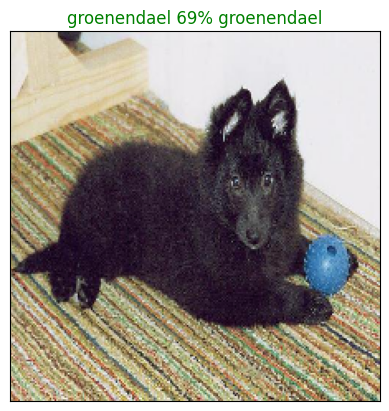

In [67]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

The function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
* Prediction probabilities indexes ✅
* Prediction probabilities values ✅
* Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [68]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

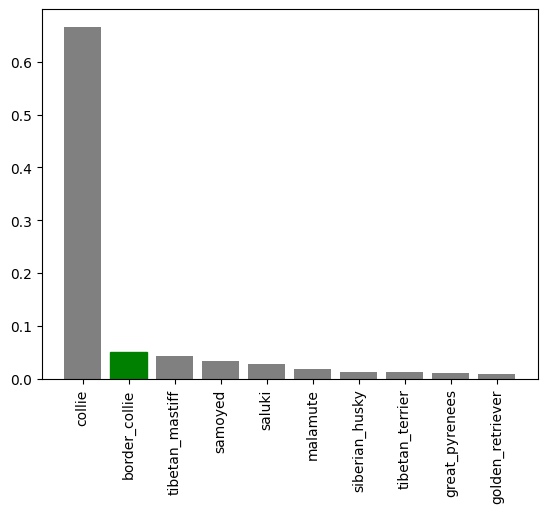

In [69]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Checking multiple images

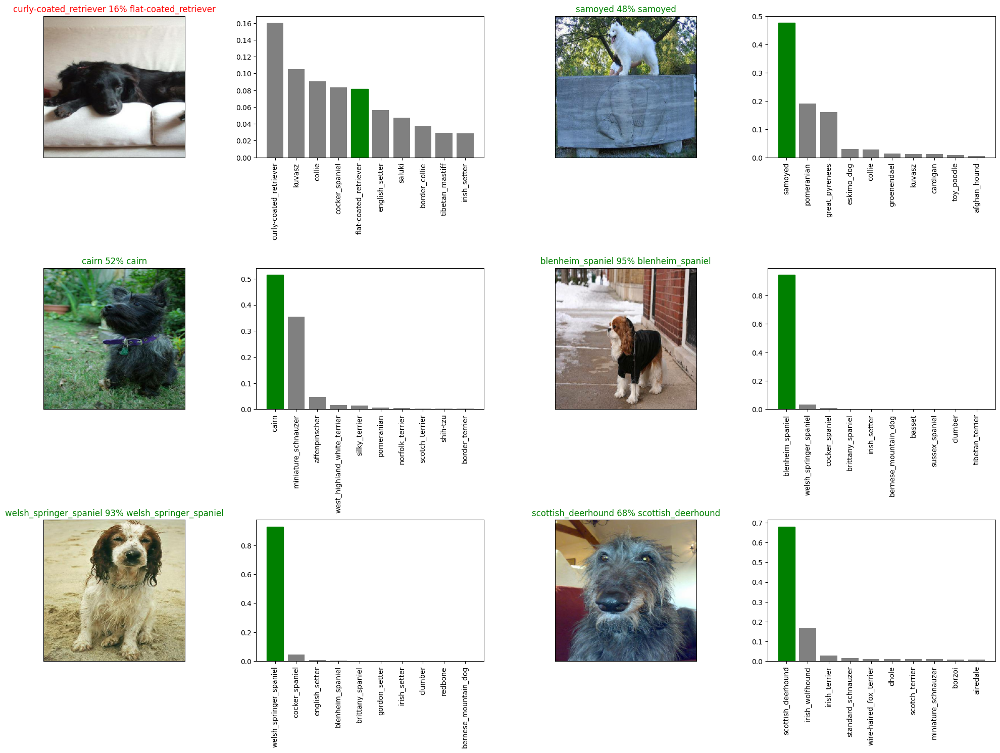

In [70]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### Saving and reloading a trained model

In [71]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [72]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [73]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20241208-16501733676612-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20241208-16501733676612-1000-images-mobilenetv2-Adam.h5'

In [75]:

# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20241208-16501733676612-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20241208-16501733676612-1000-images-mobilenetv2-Adam.h5


In [76]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 2s 215ms/step - loss: 1.2161 - accuracy: 0.7050


[1.2160791158676147, 0.7049999833106995]

In [77]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 114ms/step - loss: 1.2161 - accuracy: 0.7050


[1.2160791158676147, 0.7049999833106995]

In [78]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [79]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [80]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping =keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [81]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 56s 159ms/step - loss: 1.3398 - accuracy: 0.6752
Epoch 2/100
320/320 [==============================] - 46s 143ms/step - loss: 0.3978 - accuracy: 0.8837
Epoch 3/100
320/320 [==============================] - 46s 143ms/step - loss: 0.2350 - accuracy: 0.9364
Epoch 4/100
320/320 [==============================] - 44s 137ms/step - loss: 0.1516 - accuracy: 0.9655
Epoch 5/100
320/320 [==============================] - 46s 145ms/step - loss: 0.1072 - accuracy: 0.9781
Epoch 6/100
320/320 [==============================] - 44s 138ms/step - loss: 0.0782 - accuracy: 0.9865
Epoch 7/100
320/320 [==============================] - 44s 136ms/step - loss: 0.0576 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - 43s 136ms/step - loss: 0.0460 - accuracy: 0.9934
Epoch 9/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0380 - accuracy: 0.9957
Epoch 10/100
320/320 [==============================] - 44s 138m

In [82]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20241208-17111733677916-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20241208-17111733677916-full-image-set-mobilenetv2-Adam.h5'

In [83]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20241208-17111733677916-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20241208-17111733677916-full-image-set-mobilenetv2-Adam.h5


### Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.        

To make predictions on the test data, we'll:

* Get the test image filenames.
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [85]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/000621fb3cbb32d8935728e48679680e.jpg',
 'drive/MyDrive/Dog Vision/test/00102ee9d8eb90812350685311fe5890.jpg',
 'drive/MyDrive/Dog Vision/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'drive/MyDrive/Dog Vision/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'drive/MyDrive/Dog Vision/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 'drive/MyDrive/Dog Vision/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 'drive/MyDrive/Dog Vision/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 'drive/MyDrive/Dog Vision/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 'drive/MyDrive/Dog Vision/test/002f80396f1e3db687c5932d7978b196.jpg',
 'drive/MyDrive/Dog Vision/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [86]:
len(test_filenames)

10357

In [87]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [88]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [90]:
len(test_filenames)

10357

In [91]:
# creating test data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [92]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [94]:
# making prediction on test data batach using full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 47s 145ms/step


In [97]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [98]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [99]:
test_predictions[:10]

array([[7.38380364e-12, 4.13384084e-12, 1.06279367e-14, ...,
        5.50629454e-14, 1.10559295e-09, 2.31723096e-11],
       [1.01484056e-06, 3.31662420e-07, 5.99311960e-08, ...,
        2.49628547e-11, 7.56776686e-08, 3.48418350e-10],
       [1.78466950e-10, 4.77572303e-06, 3.27830207e-08, ...,
        3.35059354e-07, 7.81714071e-09, 6.15445916e-10],
       ...,
       [1.49928403e-09, 2.91677828e-11, 2.37118492e-10, ...,
        1.79844171e-12, 2.71708654e-12, 2.56786432e-11],
       [6.79478132e-12, 2.83536500e-10, 5.89348015e-10, ...,
        2.18107161e-07, 4.14495638e-08, 3.52323240e-11],
       [3.10882475e-09, 2.98471074e-11, 2.95460011e-11, ...,
        8.52688742e-13, 4.01625226e-11, 1.61371247e-07]])

In [100]:
test_predictions.shape

(10357, 120)

### Preparing the predicted data for kaggle

In [101]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds)) #one column for each brred name
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [102]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [103]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00102ee9d8eb90812350685311fe5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0012a730dfa437f5f3613fb75efcd4ce,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001510bc8570bbeee98c8d80c8a95ec1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001a5f3114548acdefa3d4da05474c2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [104]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,7.383804e-12,4.133841e-12,1.062794e-14,1.919274e-13,4.074301e-13,1.094534e-11,4.641654e-16,4.093564e-13,2.736061e-13,...,1.057664e-12,7.308080e-14,1.873033e-14,2.819638e-15,5.405945e-14,6.300431e-13,4.165760e-13,5.506295e-14,1.105593e-09,2.317231e-11
1,00102ee9d8eb90812350685311fe5890,1.014841e-06,3.316624e-07,5.993120e-08,1.704888e-09,3.894945e-07,8.994058e-09,1.825993e-07,3.930675e-07,8.533792e-09,...,8.838301e-09,4.568577e-07,2.198517e-09,2.790978e-06,1.177637e-08,7.338458e-08,1.516897e-04,2.496285e-11,7.567767e-08,3.484183e-10
2,0012a730dfa437f5f3613fb75efcd4ce,1.784669e-10,4.775723e-06,3.278302e-08,2.611895e-09,1.459536e-10,2.148520e-08,7.855665e-11,1.040728e-10,1.191608e-08,...,5.586575e-12,4.603122e-11,1.444456e-07,2.372163e-06,2.771550e-07,5.754521e-08,1.616483e-11,3.350594e-07,7.817141e-09,6.154459e-10
3,001510bc8570bbeee98c8d80c8a95ec1,5.509141e-06,8.550911e-07,8.725897e-08,1.161034e-05,2.142681e-04,4.156210e-06,2.810763e-10,2.697906e-08,5.544151e-07,...,2.994543e-06,1.469529e-10,2.761555e-06,3.133572e-09,4.774496e-07,2.249185e-08,1.288318e-13,1.150163e-02,7.835849e-10,7.582040e-07
4,001a5f3114548acdefa3d4da05474c2e,3.002130e-05,1.153541e-05,5.084305e-09,6.989737e-10,5.600408e-10,9.778655e-12,1.737562e-10,5.637213e-09,2.697469e-09,...,1.006559e-07,1.114921e-10,2.422730e-11,2.663453e-11,2.453769e-10,2.266333e-10,2.260025e-11,8.158219e-10,3.886606e-10,3.953045e-08


In [105]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/for-kaggle-mobilenetV2.csv",
                index=False)

### The most fun part i.e making prediction on custom images

In [107]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/Random-dogz/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [108]:
custom_image_paths

['drive/MyDrive/Dog Vision/Random-dogz/toy.jpg',
 'drive/MyDrive/Dog Vision/Random-dogz/irish-wolf.jpeg',
 'drive/MyDrive/Dog Vision/Random-dogz/afg-hou.jpg']

In [109]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [110]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [111]:
custom_preds.shape

(3, 120)

In [112]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['miniature_poodle', 'scottish_deerhound', 'afghan_hound']

In [113]:
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

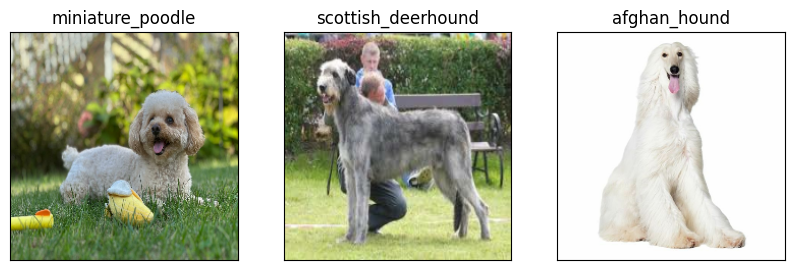

In [114]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)